# Traveling Salesman Problem

The TSP is the problem of finding the shortest tour through a given configuration of cities such that each city is visited exactly once.

In this tutorial, we will solve the Traveling Salesman Problem (TSP) using the D-Wave Quantum Annealer JUPSI at JSC.

We will start with a manual formulation of a simple four-city problem. Then we consider the solution of larger problems using both the D-Wave QPU, which requires the tuning of several QPU parameters, and the D-Wave hybrid solver service. To achieve this, we will be utilizing the [D-Wave Ocean SDK](https://docs.ocean.dwavesys.com/en/stable/). At the end, we will have the opportunity to consider and compare alternative problem formulations. This is a task of active research.

## Table of Contents

* [Initialization](#init)
* [Problem specification](#setup)
* [Solution on a D-Wave QPU](#qpu)
* [Solution using D-Wave Hybrid](#hybrid)
* [Optional tasks using the QPU](#qputasks)
* [Research: Alternative formulations](#additionaltasks)
* [References](#ref)

## <a class="anchor" id="init"> </a>Initialization

### Relevant packages

In [1]:
from dwave.system import DWaveSampler, EmbeddingComposite, FixedEmbeddingComposite, LeapHybridSampler
import networkx as nx
import dwave_networkx as dnx
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.geodesic as geodesic
from cartopy.io.img_tiles import OSM
from collections import defaultdict
%matplotlib inline

Helper function to visualize the solution of a problem on a D-Wave processor with Pegasus topology

In [2]:
def plot_qpu_pegasus_embedding(response, figsize=(12,12), xzoom=0.02, yzoom=0.02):
    embedding = response.info['embedding_context']['embedding']
    physical_qubits = [k for chain in embedding.values() for k in chain]
    fig,ax = plt.subplots(1, 1, figsize=figsize)
    dnx.draw_pegasus(dnx.pegasus_graph(16), ax=ax, crosses=True, node_size=30, node_color='red', edge_color='gray')
    dnx.draw_pegasus(dnx.pegasus_graph(16, node_list=physical_qubits), ax=ax, crosses=True, node_color='blue', node_size=70)
    plt.margins(x=-xzoom, y=-yzoom)
    plt.show()

### Getting started

If this notebook is run on [JUNIQ](https://juniq.fz-juelich.de/), all packages should be pre-installed.
To setup your D-Wave environment for running the [D-Wave Ocean SDK](https://docs.ocean.dwavesys.com/en/stable/overview/install.html), you need to add your personal token (accessible through [D-Wave Leap](https://cloud.dwavesys.com/leap)) to your config file `~/.config/dwave/dwave.conf` (e.g. by editing this file in a terminal by clicking `File -> New -> Terminal`).
More information can be found in the [Getting Started Notebook](https://jugit.fz-juelich.de/qip/juniq-platform/juniq-documentation/-/blob/master/004-Quantum-computing/D-Wave/Getting_started.ipynb) of the [JUNIQ online documentation](https://jugit.fz-juelich.de/qip/juniq-platform/juniq-documentation/-/tree/master/004-Quantum-computing/D-Wave).

If this notebook is run in a local environment (not JUNIQ), the D-Wave Ocean SDK needs to be installed as described in the [documentation of the package `dwave-ocean-sdk`](https://docs.ocean.dwavesys.com/en/stable/overview/install.html). Additionally, it is helpful to install [`cartopy`](https://scitools.org.uk/cartopy/docs/latest/) for the visualizations to work (NOTE: this might require installing [GEOS](https://libgeos.org/usage/install/); additionally, there is a bug in the `shapely` package: if the kernel dies on `plot_tsp_graph`, the following command fixed the problem for most users: `pip install --force-reinstall --no-binary :all: shapely`)

## <a class="anchor" id="setup"> </a>Problem specification

We consider the TSP for several large cities in Europe

In [3]:
cities =     ["Cologne",  "Berlin",    "Rome",  "Madrid",  "London", "Bucharest", "Paris",  "Vienna",  "Warsaw",]
longitudes = [ 6.952778, 13.383333, 12.496366, -3.716667,  0.127543,   26.103889,  2.3508, 16.366667, 21.016667,]
latitudes =  [50.936389, 52.516667, 41.902782, 40.383333, 51.507222,   44.432503, 48.8567,      48.2, 52.233333,]

Compute the geodesic distances (in km) between all cities

In [4]:
edges     = [(i,j) for i in range(len(cities)) for j in range(len(cities)) if i != j]
distances = {
    (i,j): geodesic.Geodesic().geometry_length(np.array([
        [longitudes[i], latitudes[i]],
        [longitudes[j], latitudes[j]]
    ]))/1000 for i,j in edges
}
distances

{(0, 1): 477.63735258254786,
 (0, 2): 1090.0800761012765,
 (0, 3): 1434.5876168547686,
 (0, 4): 480.8571945771412,
 (0, 5): 1602.9697149229776,
 (0, 6): 403.4102855857366,
 (0, 7): 745.1682115118152,
 (0, 8): 983.8032270602403,
 (1, 0): 477.63735258254786,
 (1, 2): 1181.8825475436095,
 (1, 3): 1873.651064863945,
 (1, 4): 915.7207027671083,
 (1, 5): 1297.5322026867902,
 (1, 6): 878.2828665026492,
 (1, 7): 524.8917398239116,
 (1, 8): 520.5615470508003,
 (2, 0): 1090.0800761012765,
 (2, 1): 1181.8825475436095,
 (2, 3): 1369.4634389141572,
 (2, 4): 1422.5305077191697,
 (2, 5): 1140.1804115847942,
 (2, 6): 1106.6858103582092,
 (2, 7): 763.0997340728435,
 (2, 8): 1316.1843198246283,
 (3, 0): 1434.5876168547686,
 (3, 1): 1873.651064863945,
 (3, 2): 1369.4634389141572,
 (3, 4): 1271.3751573006587,
 (3, 5): 2481.3483553440788,
 (3, 6): 1056.754206205442,
 (3, 7): 1815.3281017676675,
 (3, 8): 2297.7834884019276,
 (4, 0): 480.8571945771412,
 (4, 1): 915.7207027671083,
 (4, 2): 1422.5305077191697,

Plot the TSP graph

In [5]:
def plot_tsp_graph(edges, numcities=len(cities), showalledges=True, figsize=(16,8), extent=[-5,34,39,54], zoom=5):
    imagery = OSM()
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(1, 1, 1, projection=imagery.crs)
    ax.set_extent(extent, ccrs.PlateCarree())
    ax.add_image(imagery, zoom)
    xs, ys = longitudes, latitudes
    for i,j in edges:
        if (i < numcities and j < numcities) or showalledges:
            plt.plot([xs[i], xs[j]], [ys[i], ys[j]], color='blue', linewidth=2, transform=ccrs.PlateCarree())
    for i in range(numcities):
        ax.plot(xs[i], ys[i], marker='o', color='red', markersize=11, transform=ccrs.Geodetic())
        ax.text(xs[i] + 0.2, ys[i] + 0.2, f'{i}: {cities[i]}', horizontalalignment='left', color='black', fontsize=16, fontweight='bold', transform=ccrs.Geodetic())
    plt.show()

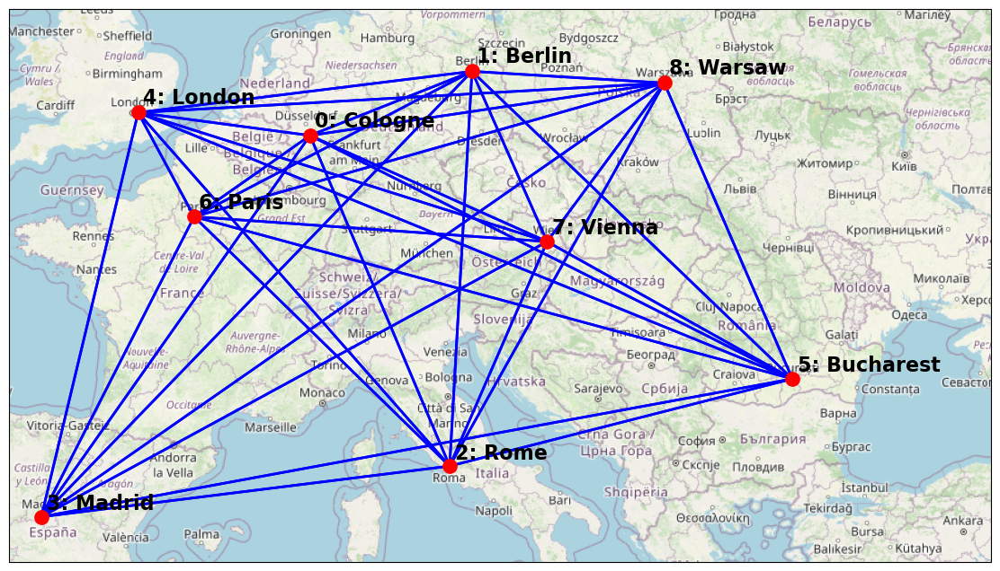

In [6]:
plot_tsp_graph(edges)  # NOTE: if this is run locally and causes the kernel to die, this is due to a shapely bug (see the Getting started section above)

### Building the QUBO

We first consider a time-encoding formulation of the TSP as a QUBO:

<div align="center">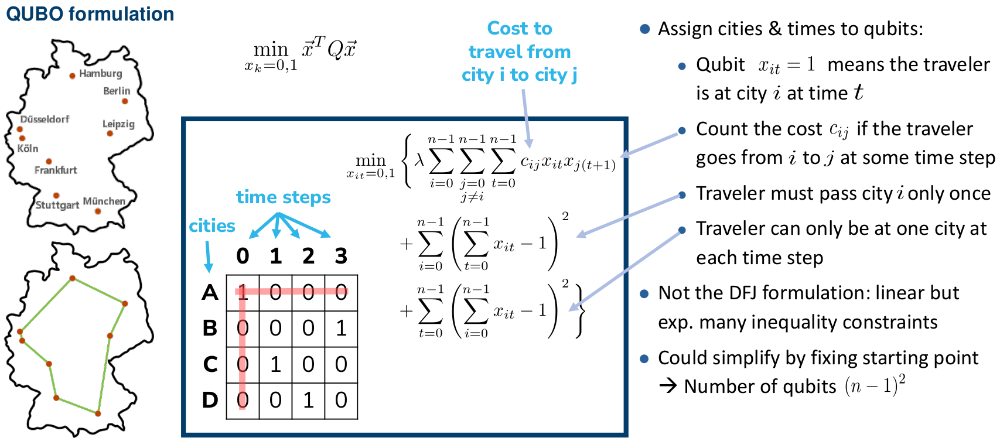</div>

For now, we consider only the first $n=4$ cities

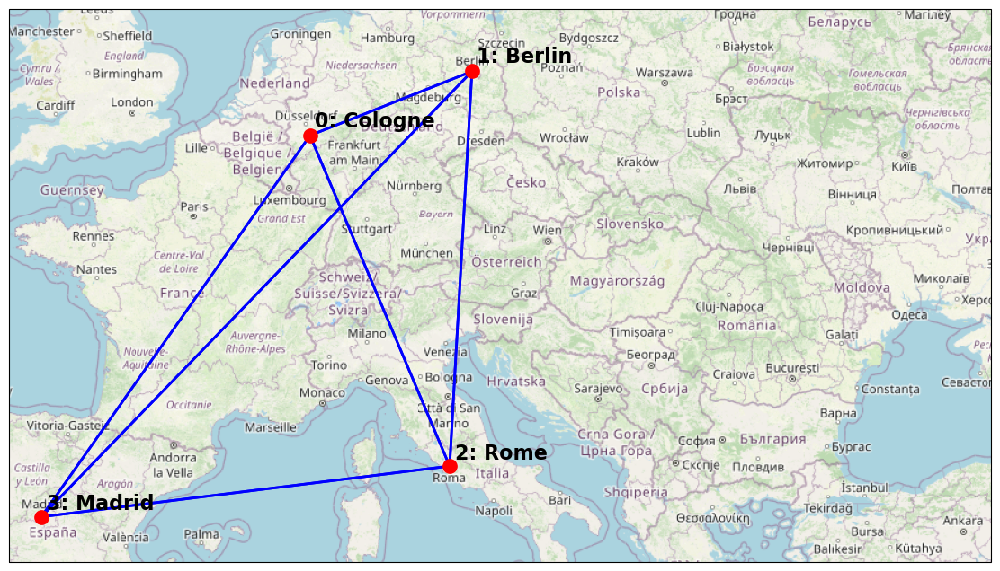

In [7]:
n = 4
plot_tsp_graph(edges, numcities=n, showalledges=False)

We build the QUBO matrix $Q$ for $n$ cities by rewriting the minimization problem as

$$
\large
\min_{x}\left(\sum_{k=0}^{n^2-1}\sum_{l=0}^{n^2-1} x_k Q_{kl} x_l \right)
$$

We choose the following mapping between the qubit index `k` and the problem-variable indices `i` and `t`:
```
k = i*n + t
```
Thus the "inner" index `t` has stride 1, and the outer index `i` has stride `n` (Note: this is called a row-major storage of $x_k = x_{it}$, since the rows of $x_{it}$ are stored first and their items $(x_{i0}, x_{i1}, \ldots)$ lie consecutively in memory)

With this definition, we construct the QUBO matrix using the following rules:

1. The linear terms $\propto x_{it}$ correspond to those with $k=l$ (since for Boolean variables, $x_k^2 = x_k$). Their prefactors will be added to the diagonal items `Q[k,k]` where 

```
k = i*n + t
```

2. The quadratic terms $\propto x_{it_1} x_{jt_2}$ will be added to the corresponding off-diagonal items `Q[k,l]` where


```
k = i*n + t1
l = j*n + t2
```

In [8]:
Q = defaultdict(float) # the entries of the QUBO matrix have to be stored in a dictionary
                       # (with tuples (k,l) as keys and numbers Qkl as values)
                       # such that Q[k,l] = Qkl
                       # NOTE: we use defaultdict(float) instead of {} 
                       #       such that Q[k,l] is automatically initialized to 0 if (k,l) does not exist in Q yet
offset = 0             # to keep track of the constant energy offset
                       # (so that we can later interpret the energy as the total distance traveled)
lamda = 0.0001         # Lagrange multiplier to weight the respective contributions of the cost function and constraints
                       # NOTE: one usually calls it `lamda` since `lambda` is a keyword in python

<font size="4"><span style='background:yellow'>**Exercise:**</span></font> Add all entries to the QUBO matrix $Q$

First add the entries corresponding to the cost function,

$$
\large
\sum_{i=0}^{n-1} \sum_{j=0\\ j\neq i}^{n-1} \sum_{t=0}^{n-1} \lambda c_{ij} x_{it} x_{j(t+1)} \,,
$$

to $Q$, where $c_{ij}$ is given by the distance between city $i$ and $j$ in kilometers.

NOTE: the time index $t+1$ is to be understood modulo $n$, i.e., it has to wrap around at $t+1=n\equiv 0$ to match the first city with the last city of the tour.

In [9]:
for i in range(n):
    for j in range(n):
        if j != i:
            for t in range(n):
                # add the corresponding contribution $\lambda * c_{ij}$ to Q[k,l] using the variables `lamda` and `distances`
                # for this, you need to compute the qubit indices k and l from i,j,t using the equations under 1. and 2. above
                # ADD-YOUR-CODE
                

Then multiply out and add the constraints to the corresponding entries of $Q$.

First constraint:
$$
\large
\sum_{i=0}^{n-1} \left(\sum_{t=0}^{n-1} x_{it} - 1\right)^2
=
\sum_{i=0}^{n-1} \left(\sum_{t_1,t_2=0}^{n-1} x_{it_1} x_{it_2} - 2 \sum_{t=0}^{n-1} x_{it} + 1\right)
$$

In [10]:
for i in range(n):
    # add the contributions of the first term in brackets on the right-hand side
    for t1 in range(n):
        for t2 in range(n):
            # ADD-YOUR-CODE
            
    # add the contributions of the second term in brackets on the right-hand side
    # ADD-YOUR-CODE
    
    # add the contributions of the constant energy offset to the variable ``offset''
    # ADD-YOUR-CODE
    

Second constraint:
$$
\Large
\sum_{t=0}^{n-1} \left(\sum_{i=0}^{n-1} x_{it} - 1\right)^2
=
\sum_{t=0}^{n-1} \left(\sum_{i,j=0}^{n-1} x_{it} x_{jt} - 2 \sum_{i=0}^{n-1} x_{it} + 1\right)
$$

In [11]:
# ADD-YOUR-CODE


Here are some results to check your code for `n=4` and `0.0001`:
```
print(offset)
print(Q[0,0])
print(Q[0,1]+Q[1,0])
print(Q[0,5]+Q[5,0])

8
-2.0
2.0
0.04776373525825479
```

In [12]:
# uncomment these lines to check your code (hint: do not care about differences after 15 digits, they are beyond machine precision)
#print(offset)
#print(Q[0,0])
#print(Q[0,1]+Q[1,0])
#print(Q[0,5]+Q[5,0])

8
-2.0
2.0
0.04776373525825479


<font size="4"><span style='background:yellow'>**Exercise:**</span></font> Write a function `build_qubo_time_encoding(n, lamda)` to automatize building the QUBO:

- We have so far constructed the QUBO matrix `Q` for `n=4` and `lamda=0.0001`.
- Your task is to combine all these steps in a single function to build the QUBO for any given `n` and `lamda`.
- Return the QUBO and the energy offset `(Q,offset)`

In [13]:
def build_qubo_time_encoding(n, lamda):
    # ADD-YOUR-CODE: return Q and the energy offset
    

To check your function, we now we visualize the QUBO matrix $Q$. 

Since $x_k x_l = x_l x_k$, the same QUBO can be represented by different matrices. To make them uniform and comparable, we can aggregate all entries of $Q$ in the upper triangle where $k \le l$. 

In this form, the visualization of $Q$ shows a universal pattern that one can also find in many other application problems besides the TSP.

Note that the minimization problem $\min\left(\sum_{k,l} Q_{kl} x_k x_l\right)$ is always the same, independent of how the entries $Q_{kl}$ and $Q_{lk}$ are distributed!

In [14]:
# you can use the following function to plot this matrix
def plot_qubo_matrix(Q, figsize=(10,8), showlabels=False, showvalues=False):
    seen = set()
    keys = [key for key in sum(map(list,Q), start=[]) if not (key in seen or seen.add(key))]
    keys.sort()
    Q = {(keys.index(keyi), keys.index(keyj)): Q[keyi,keyj] for keyi,keyj in Q}
    dim = max(max(i,j) for i,j in Q) + 1
    Qmatrix = np.zeros((dim,dim))
    for (i,j),Qij in Q.items():
        if i > j:  # aggregate terms in the upper triangle
            i,j = j,i
        Qmatrix[i,j] += Qij
    plt.figure(figsize=figsize)
    plt.imshow(Qmatrix, cmap='Spectral')
    if showvalues:
        for i in range(dim):
            for j in range(i,dim):
                plt.text(j, i, f'{Qmatrix[i,j]:.2f}', ha='center', va='center')
    Qmax = np.max(np.abs(Qmatrix))
    plt.clim((-Qmax,Qmax))
    plt.colorbar()
    if showlabels:
        plt.xticks(range(dim), keys)
        plt.yticks(range(dim), keys)
    plt.show()

Test your function by visualizing the QUBO for all cities.

The result of `plot_qubo_matrix(build_qubo_time_encoding(len(cities), 0.001)[0])` should look like
<div align="left">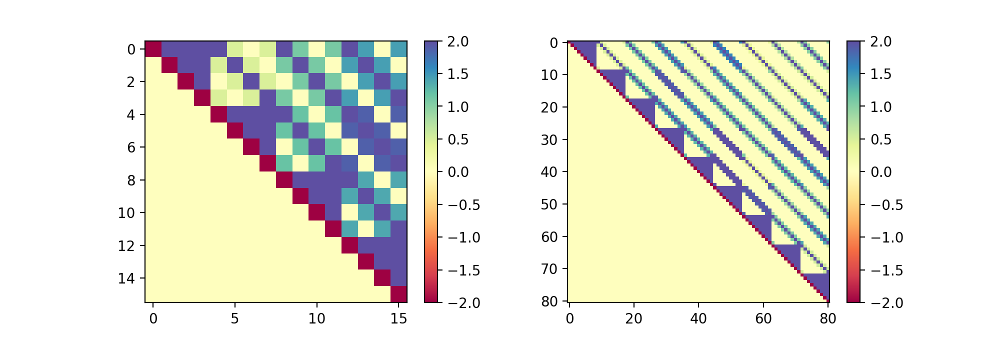</div>

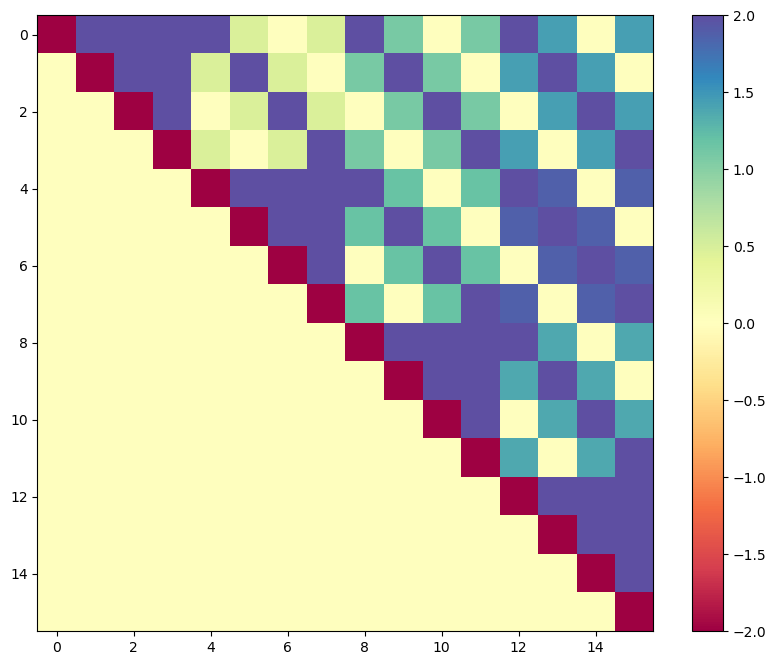

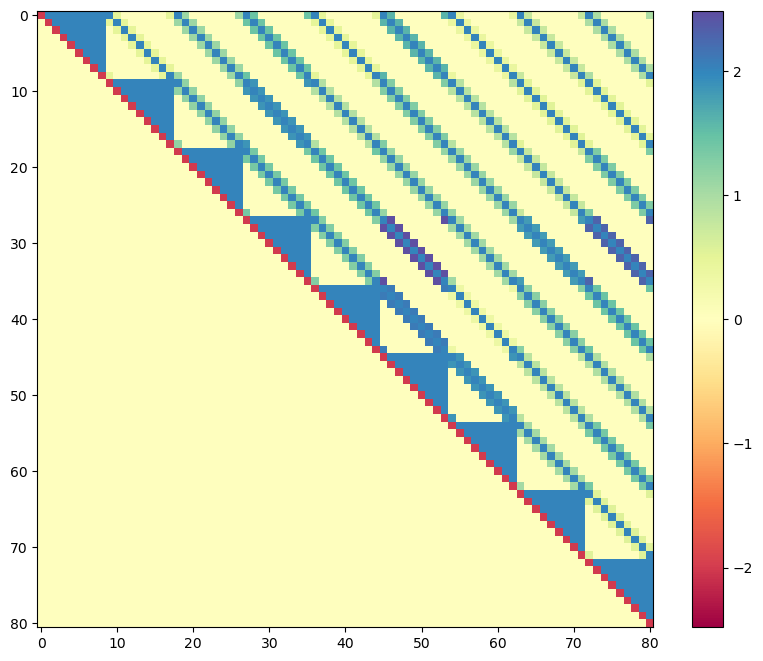

In [15]:
# uncomment these lines to check your code
#plot_qubo_matrix(build_qubo_time_encoding(4, 0.001)[0])
#plot_qubo_matrix(build_qubo_time_encoding(len(cities), 0.001)[0])

## <a class="anchor" id="qpu"> </a>Solution on a D-Wave QPU

Select the QPU with the highest number of qubits in either Europe (`region='eu-central-1'`) or North America (`region='na-west-1'`)

NOTE: for this [feature-based solver selection](https://support.dwavesys.com/hc/en-us/articles/1500007171721-What-is-Feature-Based-Solver-Selection-) to work, your config file `~/.config/dwave/dwave.conf` should only specify your access token from Leap

In [16]:
sampler = DWaveSampler(region='eu-central-1')
#sampler = DWaveSampler(region='na-west-1')  # alternative to select a QPU in North America

print(f'Selected QPU {sampler.properties["chip_id"]} with {len(sampler.nodelist)} qubits and {sampler.properties["topology"]["type"]} topology')

Selected QPU Advantage_system5.4 with 5614 qubits and pegasus topology


For now, we do not care about how our problem is embedded on the QPU, so we do not create a manual embedding. Therefore, we have to wrap `sampler` in an EmbeddingComposite. It will generate a new embedding automatically on each call.

In [17]:
solver = EmbeddingComposite(sampler)  # NOTE: if an embedding is available, one can instead use FixedEmbeddingComposite (see below)

### Submit to the QPU

Here we submit the QUBO to the QPU. The function `sample_qubo` can take several optional parameters, for instance:

- `num_reads` specifies the number of samples that we want to get, i.e., the number of quantum annealing runs we want the QPU to perform
- `return_embedding` specifies that the generated embedding will be stored (so that we can later visualize where on the QPU our problem was solved)
- `chain_strength` specifies the chain strength between physical qubits used in the embedding (see below)
- `annealing_time` specifies the time in microseconds that we want the annealing process to take (see below); the default can be queried using sampler.properties (usually 20 microseconds)

In [18]:
response = solver.sample_qubo(Q, num_reads=100, return_embedding=True)  # optional additional parameters: chain_strength, annealing_time (see below)
result = response.aggregate().to_pandas_dataframe().sort_values('energy').reset_index(drop=True)
result

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,chain_break_fraction,energy,num_occurrences
0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0.0,-7.553643,5
1,1,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0.0,-7.553643,4
2,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0.0,-7.553643,2
3,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,0.0,-7.553643,9
4,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0.0,-7.553643,4
5,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0.0,-7.518917,3
6,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0.0,-7.518917,3
7,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0.0,-7.518917,1
8,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0.0,-7.518917,3
9,0,0,0,1,1,0,0,0,0,0,1,0,0,1,0,0,0.0,-7.518917,6


Run this cell to visualize where on the chip the problem was solved

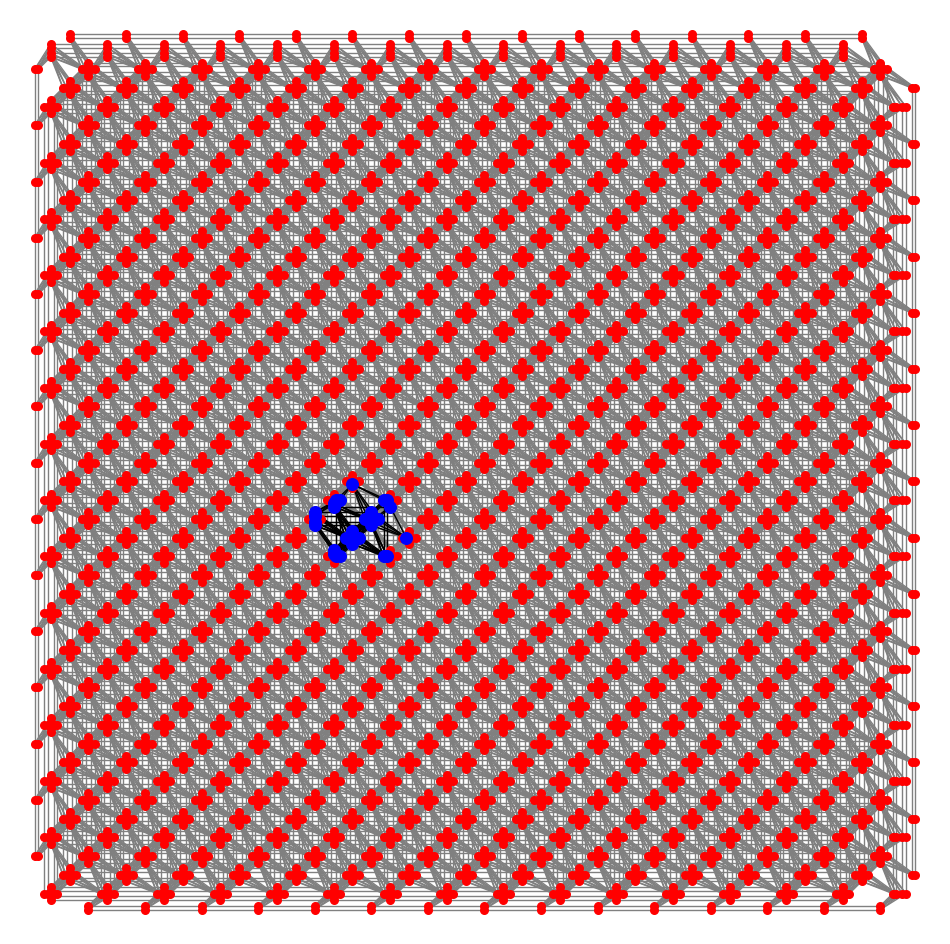

In [19]:
plot_qpu_pegasus_embedding(response)

In [20]:
# NOTE: in the future, inspection of the results (including where the problem was solved on the D-Wave) can also be done using D-Wave Inspector
#import dwave.inspector  # after importing this, the previous cells needs to be rerun, because dwave inspector causes additional information about the solution to be stored
#dwave.inspector.show(response)

### Parse the results

Now we parse the samples returned by the QPU

In [21]:
touridx = 0  # first we only look at the lowest-energy sample
tourmatrix = result.loc[touridx][:n**2].to_numpy().reshape((n,n))
tourmatrix

array([[0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.],
       [1., 0., 0., 0.]])

In [22]:
for t in range(n):
    for i in range(n):
        if tourmatrix[i,t] == 1:
            print(f'At time {t}, we are in city {i} ({cities[i]})')

At time 0, we are in city 3 (Madrid)
At time 1, we are in city 2 (Rome)
At time 2, we are in city 1 (Berlin)
At time 3, we are in city 0 (Cologne)


Note that it is also possible to parse the tour matrix using the function `np.nonzero` to obtain the tour.

If executed on the transpose `tourmatrix.T`, the first array will represent the ascending time indices and the second array represents the corresponding cities (note that the transpose is necessary such that the time indices are increasing).

In [23]:
times,tour = np.nonzero(tourmatrix.T)
print(times)
print(tour)

[0 1 2 3]
[3 2 1 0]


Now we build a list `touredges` of connected cities `(i,j)` to visualize the resulting tour using the function `plot_tsp_graph` above.

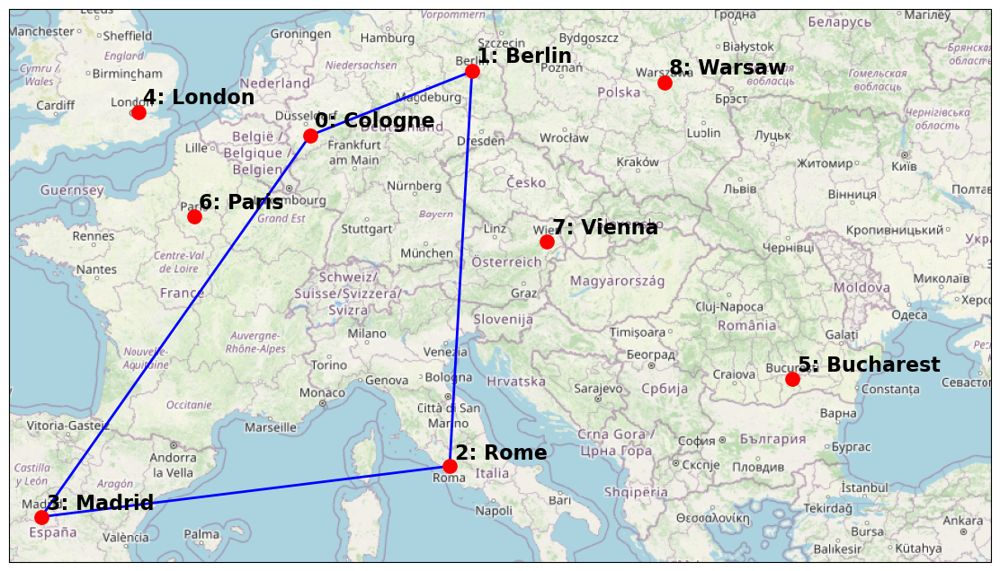

In [24]:
touredges = []
for idx in range(len(tour)):
    touredges.append((tour[idx], tour[(idx+1)%len(tour)]))
plot_tsp_graph(touredges)

<font size="4"><span style='background:yellow'>**Exercise:**</span></font>: Write a function to analyze and visualize a resulting tour with index `touridx`. 

- Evaluate the tour and fill the dictionary `evaluation` with information about the tour
- If the parameter `display=False`, only return the dictionary
- If the parameter `display=True`, additionally visualize the tour using `plot_tsp_graph` and print if it is valid, too short, too long, or if it visits some cities more than once.
- Note: For convenience, we additionally pass the number of cities `n` so it can be used in the function

Example result (for one of the high-energy samples with a large `touridx`):
```
{'tour': array([0, 3, 0, 1, 2]),
 'touredges': [(0, 3), (3, 0), (0, 1), (1, 2), (2, 0)],
 'tourdistance': 2749.599976227434,
 'valid': False,
 'message': 'is too long',
 'multiplicity': 1,
 'energy': -0.9976949544614055}
```

In [26]:
def evaluate_resulting_tour(n, result, touridx, display=False):
    evaluation = {
        'tour': [],
        'touredges': [],
        'tourdistance': np.inf,      # the total distance traversed (in km) Hint: edges of the form (i,i) are not in the dictionaries distances but should be counted as 0
        'valid': False,              # whether the tour satisfies the two constraints given above
        'message': 'Not evaluated',  # whether the tour is valid, too short, too long, or visits some cities more than once
        'multiplicity': 0,           # how often this tour was sampled in result (Hint: this is accessible through result['num_occurrences'][touridx])
        'energy': 0,                 # the energy associated with this sample (Hint: this is accessible through result['energy'][touridx]; 
                                     #                                               if the tour is valid, this is related to tourdistance via the parameter lamda)
    }
    # ADD-YOUR-CODE
    

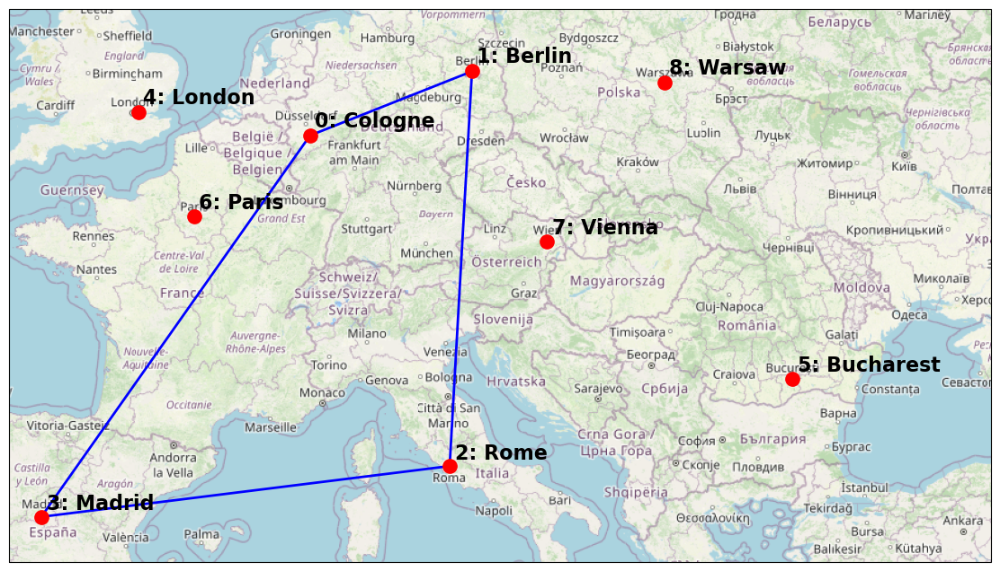

Tour 0 is valid


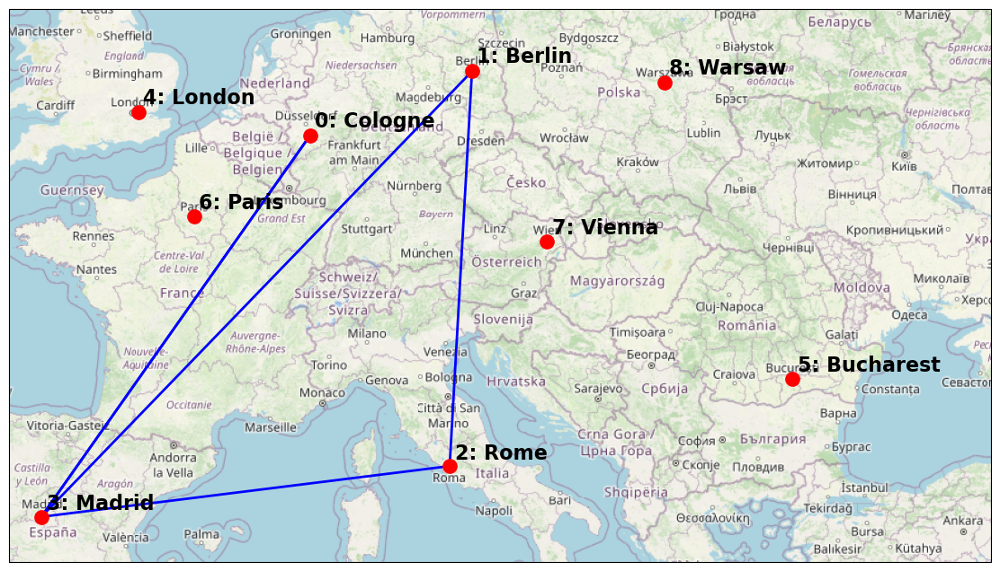

Tour 56 is too long


{'tour': array([2, 1, 3, 0, 3]),
 'touredges': [(2, 1), (1, 3), (3, 0), (0, 3), (3, 2)],
 'tourdistance': 7294.172285031249,
 'valid': False,
 'message': 'is too long',
 'multiplicity': 1,
 'energy': -3.3754580450683296}

In [27]:
# uncomment these lines to check your code
#evaluate_resulting_tour(n, result, 0, display=True)
#evaluate_resulting_tour(n, result, len(result)-1, display=True)

<font size="4"><span style='background:yellow'>**Exercise:**</span></font>: Write a function to run the TSP for an arbitrary number of cities and specifiable parameters, and process the results:

- Combine and automatize the steps for building and solving the TSP QUBO on the QPU
- Fill and return the dictionary `solution`
- Hint: The additional arguments `chain_strength`, `annealing_time`, and `embedding` will be useful for the tasks below. You can ignore them for now
- Hint: You can of course make use of your functions `build_qubo_time_encoding` and `evaluate_resulting_tour`
- Hint: Be sure to add up the `evaluation['multiplicity']` for tours with the same `tourdistance`!
- If `display=True`, print status information
- Optional: Print information about the solution process on the QPU extracted from the `response.info` object, such as the number of physical and logical qubits and the chain length (see below), the fraction of broken chains, etc.

Example result for `solve_tsp_on_qpu(4, 0.0001)`:
```
{
 'results': {
    4463.570955895083: 33,
    4810.831932461928: 32,
    5580.201305363602: 14
 },
 'successrate': 0.79,
 'alltours': {...}
}
```

In [28]:
def solve_tsp_on_qpu(n, lamda, num_reads=100, chain_strength=None, annealing_time=sampler.properties["default_annealing_time"], embedding=None, display=False):
    solution = {
        'results': {},      # a dictionary of the form {tourdistance: count} that counts the number of all VALID tours with a given distance
        'successrate': 0,   # the fraction of all samples that produced valid tours
        'alltours': {},     # a dictionary of all tour evaluations of the form {touridx: evaluate_resulting_tour(...)}
        'embedding': None,  # additional variable where you can store the embedding used (only relevant for the optional tasks below)
    }
    # ADD-YOUR-CODE
    

An example output for `solve_tsp_on_qpu(4, 0.0001, display=True)` (including some information for the optional tasks below) may look like:
```
We submitted the TSP with n=4 cities and lambda=0.0001. The energy offset of the QUBO was 8. We generated a new embedding.
The success rate for solving the TSP with 4 cities was 0.81.
The smallest tour with distance 4463.570955895083 occurred 30 / 100 times.
The lowest energy was -7.553642904410491 + offset = 0.44635709558950865.
The QPU access time was 0.02278245 seconds.
The problem used 16 logical and 38 physical qubits.
The chain strength used was 1.7354860272841364.
```

In [29]:
# uncomment these lines to check your code
#solution = solve_tsp_on_qpu(4, 0.0001, display=True)
#solve_tsp_on_qpu(4, 0.0001, embedding=solution['embedding'], display=True);  # only try that if you have implemented reusing an embedding already

We submitted the TSP with n=4 cities and lambda=0.0001. The energy offset of the QUBO was 8. We generated a new embedding.
The success rate for solving the TSP with 4 cities was 0.69.
The smallest tour with distance 4463.570955895083 occurred 8 / 100 times.
The lowest energy was -7.553642904410491 + offset = 0.44635709558950865.
The QPU access time was 0.024974450000000002 seconds.
The problem used 16 logical and 39 physical qubits.
The chain strength used was 1.7354860272841364.
We submitted the TSP with n=4 cities and lambda=0.0001. The energy offset of the QUBO was 8. We reused a previous embedding.
The success rate for solving the TSP with 4 cities was 0.64.
The smallest tour with distance 4463.570955895083 occurred 23 / 100 times.
The lowest energy was -7.553642904410491 + offset = 0.44635709558950865.
The QPU access time was 0.024974450000000002 seconds.
The problem used 16 logical and 39 physical qubits.
The chain strength used was 1.7354860272841364.


# Further tasks

At this point, you have finished the main QPU tutorial. Below this point, there are a lot of optional tasks that teach advanced concepts invaluable for research projects but whose exhaustive completion can take longer than the time frame of this school. 

Therefore, feel free to 
- pick only some of the tasks

- jump to the part on using D-Wave Hybrid below

- check out any of the alternative notebooks prepared for this school: 
    1. [Solving Garden Optimization Problems on the D-Wave Quantum Annealer](./../garden_DWAVE/garden_DWAVE.ipynb)
    2. [Solving the Knapsack Problem using the QAOA](./../garden_QAOA/garden-qaoa.ipynb)
    3. [Solving Garden Optimization Problems using the QAOA](./../knapsack_QAOA/knapsack-qaoa.ipynb)

## <a class="anchor" id="qputasks"> </a>Optional tasks using the QPU

### 1. Tuning the Lagrange parameter

If you have run the solution for different `n`, you might have noticed that the success rate depends on the value of the parameter `lamda` that weights the cost function and the constraints. In this task, we try to find a good value of `lamda`.

- Run the solution for different values of `n` and `lamda`
- Evaluate or plot the results as a function of `lamda`
- Questions: Can you find a pattern in the optimal values? Can you create a heuristic or a rule that chooses `lamda` for a given value of `n`?
- Hint: Sometimes people use an estimate of the average tour length for a given TSP
- Hint: If the results are not robust enough, you can also first find and fix an embedding (next task)

### 2. Different embeddings

If you have run the solution several times, you may have noticed that the results can fluctuate quite a bit. The reason is that each call to `EmbeddingComposite.sample` generates a new random embedding (using a [heuristic embedding generator](https://docs.ocean.dwavesys.com/projects/system/en/latest/reference/generated/minorminer.find_embedding.html)), which determines how our logical qubits $k$ and $l$ are mapped to a chain of physical qubits. This is necessary when a qubit $k$ needs couplers to more other qubits $l$ than exist on the topology. An embedding is a dictionary of the form 

```
embedding[logical_qubit] = chain_of_physical_qubits
```

- Solve a problem several times to obtain solutions for different embeddings
- Hint: The embedding dictionaries can be accessed via `response.info['embedding_context']['embedding']` after a run (NOTE: dwave.inspector needs to be imported before the run for this)
- Hint: You can copy your function `solve_tsp_on_qpu` above and add an additional parameter `embedding` which if `None` generates a new embedding, and otherwise uses the given embedding
- Hint: Embeddings can be reused by using `solver = FixedEmbeddingComposite(sampler, embedding=embedding)` within the function
- Compare the performance between the different embeddings
- Question: Do 'good' and 'bad' embeddings share common features such as long chains or similar physical qubits?
- Question: Do 'bad' results have larger chain break fractions?

### 3. Chain-strength scan

- Solve a problem for different `chain_strength`s to find an optimal relative chain strength (here, 'relative' means in relation to the largest absolute entry value of the QUBO matrix)
- Hint: Due to the fluctuation for different embeddings, it is a good idea to take and fix an embedding from a previous run (see above)
- Compare this result to the default `chain_strength=None` (which uses a heuristic to determine a suitable `chain_strength`, see [here](https://docs.ocean.dwavesys.com/projects/system/en/stable/reference/generated/dwave.system.composites.EmbeddingComposite.sample.html))
- Plot the results
- Compare your result to the characteristic shape of the chain-strength scans in Fig. 2 of [Ref. [1]](https://doi.org/10.1007/s11128-022-03476-y)

### 4. Annealing-time scan

- Solve the problem for different `annealing_time`s
- Hint: Due to the fluctuation for different embeddings, it is a good idea to take and fix an embedding from a previous run (see above)
- Hint: Sometimes it is a good idea to take geometrically spaced annealing times, such as `np.geomspace(*sampler.properties['annealing_time_range'], 10)`
- Plot the results.
- Questions: What do you observe for different annealing times? Is this expected?
- Compare your result to the annealing-time scans in Fig. 3 of [Ref. [1]](https://doi.org/10.1007/s11128-022-03476-y)

### 5. Optimization

- Implement the optimization indicated by the red lines in the QUBO formulation above
- This fixes the starting point end the end point of the tour such that only $(n-1)^2$ are required
- Compare the performance with and without this optimization
- Question: Does this lift the degeneracy of the ground state completely?
- Question: Can you solve larger problems with this optimization?

### 6. Parallelization [[Advanced]]

If you above at where on the QPU the QUBO (for a small TSP) was solved, you see that a large part of the chip was actually not used. The time to solve a larger problem, however, is always the same (meaning that parallelization comes sort of for free). It is therefore a good idea to solve several problems on different parts of the QPU **simultaneously**.

- Implement this parallelization scheme by solving several TSPs on different places of the QPU at the same time
- You can either do this by 
    1. adding several problems to the same QUBO dictionary `Q` and generating the embedding automatically as done above, or by 
    2. generating one embedding and reusing this embedding by placing the problem **manually** on different parts of the chip.
- Hint: For a manual embedding, you can use the five-dimensional **Pegasus coordinate system** as [shown in this notebook](https://jugit.fz-juelich.de/qip/juniq-platform/juniq-documentation/-/blob/master/004-Quantum-computing/D-Wave/Solving-QUBO-Problems.ipynb)
- Questions: Are the results independent of where they are placed? In other words, do different parts of the chip perform equally well? Is it possible to save computing time by performing some of the scans above in parallel?

## <a class="anchor" id="hybrid"> </a>Solution using D-Wave Hybrid

D-Wave Hybrid is a QUBO solver service offered by D-Wave. As such, it is one of the most competitive QUBO solvers available, and it is very easy to use. However, although it always uses the QPU internally, it is not possible to see how the QPU was used to obtain the results. For this reason, it may be less interesting to use from a QPU research perspective. Therefore, in this notebook, we only briefly demonstrate how to use D-Wave hybrid to solve the TSP.

In [41]:
solver = LeapHybridSampler(region='na-west-1')  # NOTE: solver has an attribute solver.properties than contains further information

In [42]:
Q,offset = build_qubo_time_encoding(9, 0.0001)  # Let D-Wave hybrid solve the full problem (question: do we need to tweak this lambda?)

In [43]:
response = solver.sample_qubo(Q)
result = response.to_pandas_dataframe()

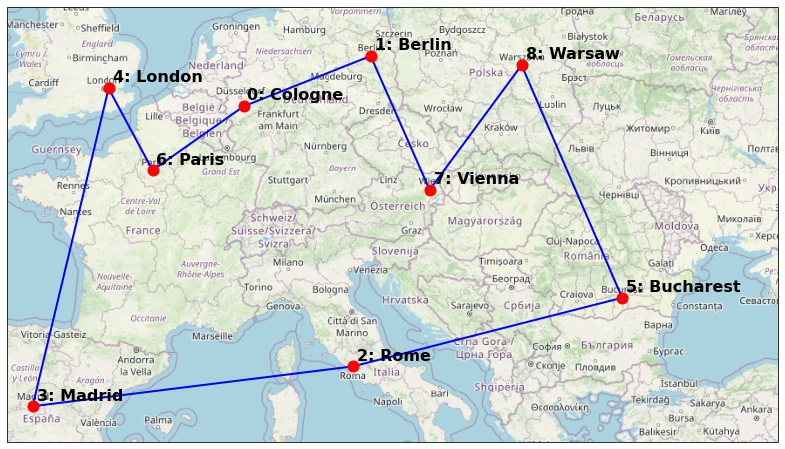

Tour 0 is valid


{'tour': array([8, 7, 1, 0, 6, 4, 3, 2, 5]),
 'touredges': [(8, 7),
  (7, 1),
  (1, 0),
  (0, 6),
  (6, 4),
  (4, 3),
  (3, 2),
  (2, 5),
  (5, 8)],
 'tourdistance': 7024.893590031046,
 'valid': True,
 'message': 'is valid',
 'multiplicity': 1,
 'energy': -17.297510743141174}

In [44]:
evaluate_resulting_tour(9, result, 0, display=True)

## <a class="anchor" id="additionaltasks"> </a>Research: Alternative formulations

The time-encoding formulation used above is only one option to encode the TSP as a QUBO, but it is by no means unique. There is a priori no reason whether an alternative formulation of the TSP may be better suited to the new technology. For instance, on a digital supercomputer, the TSP is often solved using the Dantzig-Fulkerson-Johnson formulation as it yields a linear (instead of quadratic) programming problem. However, it then has inequality constraints which provide additional difficulties.

In this section, we test alternative formulations of the TSP as a QUBO and compare the results to the time-encoding formulation above.

### 1. D-Wave NetworkX

The package [D-Wave NetworkX](https://docs.ocean.dwavesys.com/projects/dwave-networkx/en/stable/index.html) (`dwave_networkx` or `dnx`) offers the [function `traveling_salesperson_qubo`](https://docs.ocean.dwavesys.com/projects/dwave-networkx/en/stable/reference/algorithms/generated/dwave_networkx.algorithms.tsp.traveling_salesperson_qubo.html) to generate a QUBO for the TSP. The goal of this task is to compare this QUBO to the QUBO generated above:

- Generate the QUBO for different parameters offered by the [function `traveling_salesperson_qubo`](https://docs.ocean.dwavesys.com/projects/dwave-networkx/en/stable/reference/algorithms/generated/dwave_networkx.algorithms.tsp.traveling_salesperson_qubo.html)
- Visualize the QUBO and compare it to the visualization above.
- Submit the QUBO to either the hybrid solver or the QPU
- Questions:
    1. Do the formulations differ in some way?
    2. What additional ways of modifying the QUBO does the function offer?
    3. Are they useful?
- Hint: You can also look at the [source](https://docs.ocean.dwavesys.com/projects/dwave-networkx/en/stable/_modules/dwave_networkx/algorithms/tsp.html#traveling_salesperson_qubo) to see how parameters such as `lamda` are chosen by default

### 2. Dantzig-Fulkerson-Johnson with inequality constraints [[Advanced]]

The [Dantzig-Fulkerson-Johnson (DFJ) formulation](https://en.wikipedia.org/wiki/Travelling_salesman_problem#Dantzig%E2%80%93Fulkerson%E2%80%93Johnson_formulation) is a popular formulation to solve the TSP on classical digital computers. The reason is that it yields a linear programming problem that is easier to solve that the quadratic formulation resulting from the time encoding above.

However, a quantum annealer inherently includes quadratic terms. It is therefore a-priori not clear, which of both formulations perform better. 

Tasks:
- Implement the QUBO resulting from the DFJ formulation
- Solve the QUBO using either the QPU or D-Wave Hybrid
- Question: Which formulation yields better results?

Hint:

The DFJ formulation needs inequality constraints, which are not easy to include in a QUBO. One way is to encode them using slack variables, which requires several additional qubits. The way how to do this is shown in Eqs. (7)--(9) of [Ref. [2]](https://doi.org/10.48550/ARXIV.2211.13914). You can also consult the accompanying [Git repository](https://jugit.fz-juelich.de/qip/unbalanced-penalizations-qubo) to find one way of building the final QUBO.

### 3. Dantzig-Fulkerson-Johnson using unbalanced penalization [[Advanced]]

An alternative way to include the inequality constraints of the DFJ formulation is to use the Unbalanced Penalization method (see [Ref. [2]](https://doi.org/10.48550/ARXIV.2211.13914)). This method is advantageous as it does not require any additional qubits.

Perform the same steps as in the Optional advanced task 2. 

Questions:
- How does the method with Unbalanced Penalization perform?
- Can you compare your results (obtained from a real quantum computer) with those in [Ref. [2]](https://doi.org/10.48550/ARXIV.2211.13914) (which were obtained using the QAOA on the gate-based quantum computer simulator JUQCS)?

Note: The fact that a real quantum annealer may sometimes perform even better than a *simulator of an ideal gate-based quantum computer* has also been observed in [Ref. [3]](https://doi.org/10.1007/s11128-020-02692-8). Is this true here too?

### 4. Your own formulation [[Advanced]]

Can you find another way to formulate the TSP as a QUBO or Ising problem?

Some thoughts: So far, we have used a one-hot encoding to map cities and times to each other. Maybe it is possible to instead use a binary/integer encoding or a domain wall encoding?

### 5. Push D-Wave Hybrid

Add some more cities to the problem and use D-Wave Hybrid to see how far it can go! Is there a clear winner and loser among all our formulations?

## <a class="anchor" id="ref"> </a>References

[1] D. Willsch, M. Willsch, C. D. Gonzalez Calaza, F. Jin, H. De Raedt, M. Svensson, K. Michielsen<br>
**Benchmarking Advantage and D-Wave 2000Q quantum annealers with exact cover problems**<br>
*Quantum Inf. Process. 21, 141* (2022)<br>
https://doi.org/10.1007/s11128-022-03476-y

[2] A. Montanez-Barrera, D. Willsch, A. Maldonado-Romo, K. Michielsen<br>
**Unbalanced penalization: A new approach to encode inequality constraints of combinatorial problems for quantum optimization algorithms**<br>
*arXiv:2211.13914* (2022)<br>
https://doi.org/10.48550/ARXIV.2211.13914

[3] M. Willsch, D. Willsch, F. Jin, H. De Raedt, K. Michielsen<br>
**Benchmarking the quantum approximate optimization algorithm**<br>
*Quantum Inf. Process. 19, 197* (2020)<br>
https://doi.org/10.1007/s11128-020-02692-8